In [1]:
# # enable for kaggle notebook server
# !pip install contractions

In [2]:
!nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2024 NVIDIA Corporation
Built on Thu_Jun__6_02:18:23_PDT_2024
Cuda compilation tools, release 12.5, V12.5.82
Build cuda_12.5.r12.5/compiler.34385749_0


In [3]:
!nvidia-smi

Sun Apr  6 18:28:25 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   35C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [4]:
# get_ipython().kernal.do_shutdown(restart=True)
# get_ipython().kernel.do_shutdown(restart=True)
# Reinstall cuDF
# !pip install --extra-index-url=https://pypi.nvidia.com cudf-cu12==24.8.*
%load_ext cudf.pandas

In [50]:
import os, gdown, gc, random, warnings
import email
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
import string, spacy
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import TweetTokenizer, word_tokenize, sent_tokenize
from nltk.stem import WordNetLemmatizer, PorterStemmer, LancasterStemmer, SnowballStemmer
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, ConfusionMatrixDisplay
from sklearn.metrics.pairwise import cosine_similarity

from pprint import pprint
from IPython.utils import io
from IPython.display import display, HTML
from tqdm import tqdm
from sklearn.decomposition import PCA

from spacy.lang.en.stop_words import STOP_WORDS
from spacy.lang.en import English
from wordcloud import  WordCloud
from nltk import bigrams, trigrams
from collections import Counter, defaultdict

nltk.download('stopwords')
nltk.download('wordnet')
nltk.download("punkt")
nltk.download('omw-1.4')
nltk.download('punkt_tab')

warnings.filterwarnings('ignore')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


In [6]:
os.system("python -m spacy download en_core_web_md")
os.system("python -m spacy download en_core_web_sm")

0

In [7]:
# globals
# https://drive.google.com/uc?id=17fzk_EPkPuHeXuCEwkTvsYZ4TdzLFqGy
DS_NAME = "email.csv"
BATCH_SIZE=64
dataSetDriveID = "17fzk_EPkPuHeXuCEwkTvsYZ4TdzLFqGy"

In [8]:
# function to download the dataset from the url
def download_dataset_from_url(url, file_path):
    try:
        gdown.download(url, file_path, quiet=False)
        print(f"Successfully downloaded to {file_path}")
    except Exception as e:
        print(f"Error downloading file: {e}")

def download_and_prep_dataset(FILE_ID, downloadLoc="dataSet", dataSetName=""):
    # Download the dataset
    url = f'https://drive.google.com/uc?id={FILE_ID}'
    currentPath = os.getcwd()
    dataSetPath = os.path.abspath(os.path.join(currentPath, downloadLoc + "/"))

    # create directory if not exists
    if not os.path.exists(dataSetPath):
        os.mkdir(dataSetPath)

    fileFullPath = os.path.join(dataSetPath, dataSetName)
    print("file Path: ", fileFullPath)
    # download the dataset
    if not os.path.exists(fileFullPath):
        download_dataset_from_url(url=url, file_path=fileFullPath)

    # Load the dataset
    return fileFullPath

In [9]:
datasetLoc = download_and_prep_dataset(FILE_ID=dataSetDriveID, dataSetName=DS_NAME)
emailDS = pd.read_csv(datasetLoc)

emailDS = emailDS.head(20000)

file Path:  /content/dataSet/email.csv


Downloading...
From (original): https://drive.google.com/uc?id=17fzk_EPkPuHeXuCEwkTvsYZ4TdzLFqGy
From (redirected): https://drive.google.com/uc?id=17fzk_EPkPuHeXuCEwkTvsYZ4TdzLFqGy&confirm=t&uuid=49040035-1c42-4c1c-be33-bddcfe1bdf0c
To: /content/dataSet/email.csv
100%|██████████| 1.43G/1.43G [00:21<00:00, 67.0MB/s]


Successfully downloaded to /content/dataSet/email.csv


#### EMAIL DATA PreProcessing

In [13]:
emailCount, columns = emailDS.shape
print(f"#Columns: {len(emailDS.columns)}.\ncolumn names: {emailDS.columns}")
print(f"Total number of records: {emailCount}")
print("all the messages are unique")

#Columns: 2.
column names: Index(['file', 'message'], dtype='object')
Total number of records: 20000
all the messages are unique


In [14]:
def getEmailBody(message, pbar):
    body = ""
    emailObj = email.message_from_string(message)
    body += emailObj.get_payload()
    pbar.update(1)
    return body

with tqdm(total=emailCount, desc="Body column Progress") as pbar:
    emailDS["body"]  = emailDS["message"].apply(lambda x: getEmailBody(x, pbar))

Body column Progress: 100%|██████████| 20000/20000 [00:02<00:00, 9096.34it/s] 


In [15]:
# Data preprocessing

def preprocessing(sentence, pbar):
    # Remove special characters and URLs
    try:
        sentence = re.sub(r'http\S+', '', sentence)
    except Exception as ex:
        print("testUsed: ",sentence)
        raise Exception("except Cought")

    # remove html tags
    sentence = re.sub(r'<.*?>', '', sentence)

    # remove special characters
    sentence = re.sub(r'[^a-zA-Z0-9\s]', '', sentence)

    # remove digits
    sentence = re.sub(r'\d+', '', sentence)

    # remove punctuation
    sentence = sentence.translate(str.maketrans('', '', string.punctuation))

    # Convert to lowercase
    sentence = sentence.lower()

    # Update progress Bar
    pbar.update(1)

    return sentence

with tqdm(total=emailCount, desc="Col Preprocessing") as pbar:
    emailDS["body"] = emailDS["body"].apply(lambda x: preprocessing(sentence=x, pbar=pbar))
    emailDS["bodyList"] = emailDS["body"].apply(lambda x: x.split())

Col Preprocessing: 100%|██████████| 20000/20000 [00:02<00:00, 6942.49it/s]


In [16]:
emailDS.head()

,file,message,body,bodyList
0,allen-p/_sent_mail/1.,Message-ID: <18782981.1075855378110.JavaMail.e...,here is our forecast\n\n,"[here, is, our, forecast]"
1,allen-p/_sent_mail/10.,Message-ID: <15464986.1075855378456.JavaMail.e...,traveling to have a business meeting takes the...,"[traveling, to, have, a, business, meeting, ta..."
2,allen-p/_sent_mail/100.,Message-ID: <24216240.1075855687451.JavaMail.e...,test successful way to go,"[test, successful, way, to, go]"
3,allen-p/_sent_mail/1000.,Message-ID: <13505866.1075863688222.JavaMail.e...,randy\n\n can you send me a schedule of the sa...,"[randy, can, you, send, me, a, schedule, of, t..."
4,allen-p/_sent_mail/1001.,Message-ID: <30922949.1075863688243.JavaMail.e...,lets shoot for tuesday at,"[lets, shoot, for, tuesday, at]"


<function gc.collect(generation=2)>

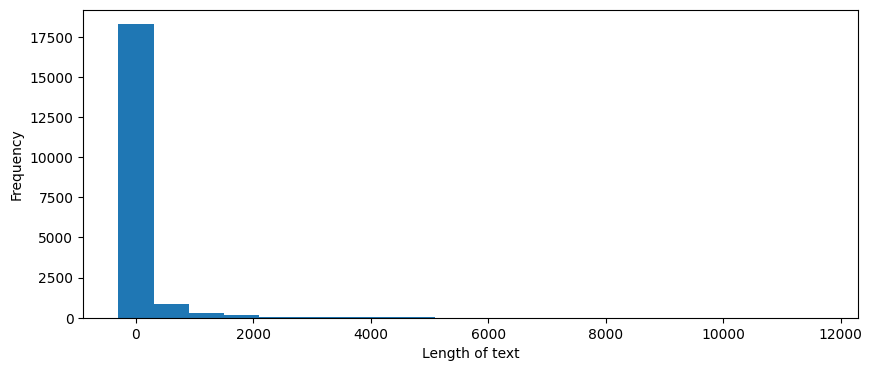

In [26]:
  x = list(emailDS['bodyList'].apply(lambda x:len(x)))
  plt.hist(x,range=[1,12000],bins = 20,align ='left')
  plt.rcParams["figure.figsize"] = (10,4)
  plt.xlabel("Length of text")
  plt.ylabel("Frequency")

  del x
  gc.collect()

In [40]:
print("top 10 most common words:")
display(emailDS["bodyList"].explode().value_counts()[0:20])

top 10 most common words:


,count
bodyList,
the,195100
to,142560
and,87721
a,78934
of,73110
in,61591
for,52970
you,50981
on,47761


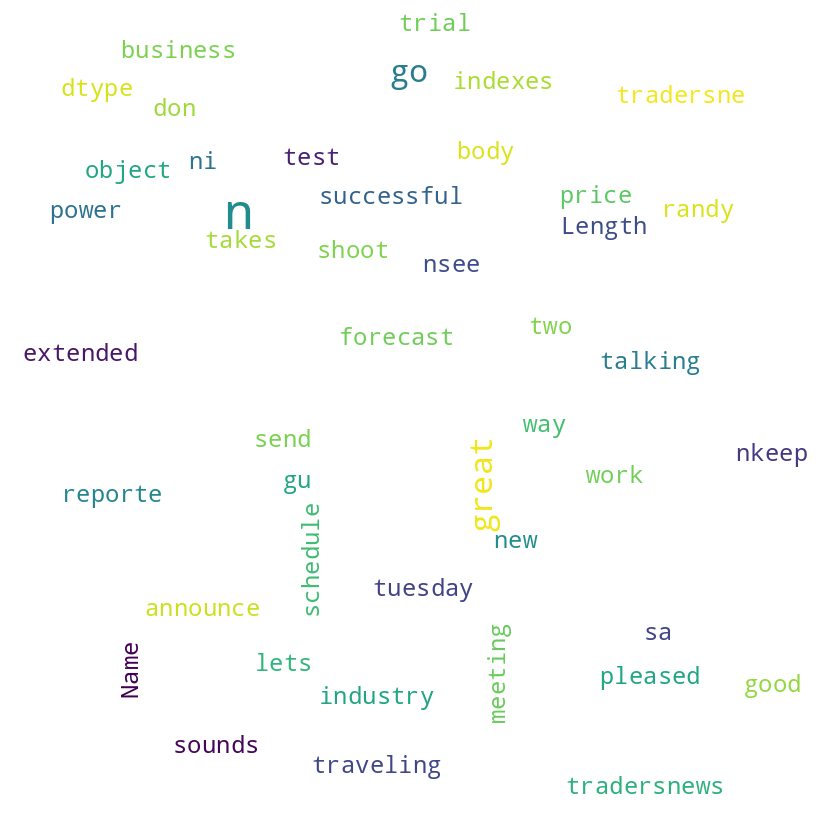

In [44]:
wordcloud = WordCloud(width = 800, height = 800,
              background_color ='white',
              max_font_size = 50,
              min_font_size = 10).generate(emailDS['body'].to_string())
# plot the WordCloud image
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)

plt.show()

In [49]:
## Train Test Split
XTrain, XTest = train_test_split(emailDS, test_size=0.2, random_state=42)
print("XTrain shape: ", XTrain.shape)
print("XTest  shape: ", XTest.shape)

del emailDS
gc.collect()

XTrain shape:  (16000, 4)
XTest  shapeL  (4000, 4)


3142468

In [51]:
def build_bigram_model(corpus):
  # Create a placeholder for model
  bigram_model1 = defaultdict(lambda: defaultdict(lambda: 0))

  # Count frequency of co-occurance
  for sentence in corpus:
      for w1, w2 in bigrams(sentence, pad_right=True, pad_left=True):
          bigram_model1[(w1)][w2] += 1

  # Let's transform the counts to probabilities
  for w1 in bigram_model1:
      print(w1)
      break
      total_count = float(sum(bigram_model1[w1].values()))
      for w2 in bigram_model1[w1]:
          bigram_model1[w1][w2] /= total_count

  return bigram_model1

In [54]:
corpus = XTrain['bodyList'].to_list()
bigram = build_bigram_model(corpus)

None


In [55]:
bigram

defaultdict(<function __main__.build_bigram_model.<locals>.<lambda>()>,
            {None: defaultdict(<function __main__.build_bigram_model.<locals>.<lambda>.<locals>.<lambda>()>,
                         {'are': 118,
                          'i': 1014,
                          'as': 107,
                          'not': 37,
                          'mark': 31,
                          'the': 423,
                          'forwarded': 1715,
                          'just': 99,
                          'kim': 25,
                          'remove': 6,
                          'mary': 28,
                          'financial': 4,
                          'shanna': 16,
                          'alright': 22,
                          'did': 79,
                          'should': 7,
                          'susan': 39,
                          None: 189,
                          'this': 262,
                          'what': 187,
                          'we': 280,
       